In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from autils import *
import matplotlib.pyplot as plt
from utils import *
import copy
import math
import plotly.express as px
%matplotlib inline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import graphviz


import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)
tf.autograph.set_verbosity(0)

2023-04-26 10:45:06.896072: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Load dataset
data = pd.read_excel("credit_risk_dataset_edited_xlsx.xlsx")

The below cell removes outliers in the dataset. For some reason, there were some anomalies in the original dataset where some ages and employment length were well above 100. This removes those examples. The code below that removes any examples where the data is null.

In [3]:
data = data[data["person_age"]<=100]
data = data[data["person_emp_length"]<=100]
data = data[data["person_income_thousands"]<= 4000]

data.dropna(subset=['loan_int_rate'], inplace=True)
data.dropna(subset=['loan_grade'], inplace=True)
data.dropna(subset=['person_emp_length'], inplace=True)

X = data.drop("loan_status", axis=1) # all columns except the target variable
y = data["loan_status"]

In [4]:
data.describe()

,person_age,person_income_thousands,loan_intent_personal,loan_intent_education,loan_intent_medical,loan_intent_venture,loan_intent_homeimprovement,loan_intent_debtconsolidation,person_emp_length,loan_grade,loan_amnt_thousands,loan_int_rate,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
count,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000,28573.000000
mean,27.710881,66.400553,0.170266,0.199244,0.184860,0.174535,0.111609,0.159486,4.778112,5.623036,9.637808,11.020680,0.177370,5.792356,0.215028
std,6.173805,51.558668,0.375873,0.399439,0.388191,0.379576,0.314890,0.366135,4.034801,1.469565,6.313231,3.205109,0.381988,4.038312,0.410849
min,20.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,5.420000,0.000000,2.000000,0.000000
25%,23.000000,39.396000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,5.000000,5.000000,7.900000,0.000000,3.000000,0.000000
50%,26.000000,55.784000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,6.000000,8.000000,10.990000,0.000000,4.000000,0.000000
75%,30.000000,80.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,7.000000,12.400000,13.470000,0.000000,8.000000,0.000000
max,84.000000,2039.784000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,41.000000,7.000000,35.000000,22.060000,1.000000,30.000000,1.000000


Below we take a look at the data to try and identify some of the patterns. In the scatterplot, examples that have a positive default on their loan are red and examples that have a negative default on their loan are blue.

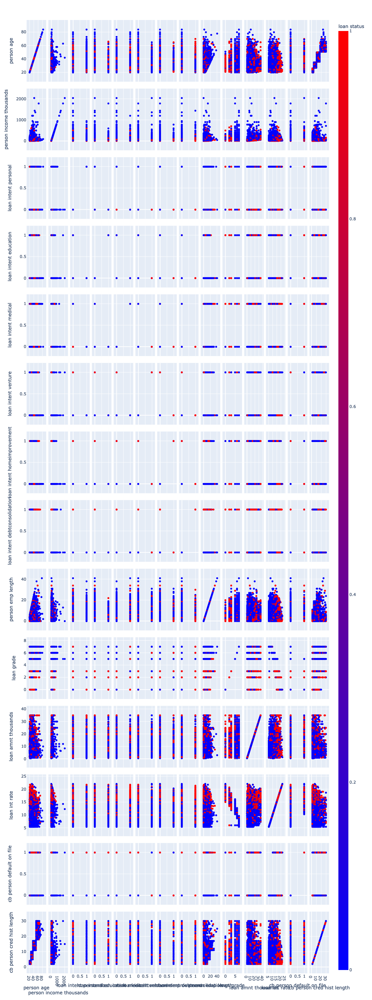

In [5]:
figure = px.scatter_matrix(data, dimensions=
["person_age","person_income_thousands","loan_intent_personal","loan_intent_education","loan_intent_medical","loan_intent_venture","loan_intent_homeimprovement","loan_intent_debtconsolidation", "person_emp_length","loan_grade","loan_amnt_thousands", "loan_int_rate", "cb_person_default_on_file", "cb_person_cred_hist_length" ],
labels={col:col.replace('_', ' ') for col in data.columns}, height=3000, width=3000, color="loan_status", color_continuous_scale=px.colors.sequential.Bluered)

figure.show()

In [6]:
data_nonDefault = data[data.loan_status == 0].loan_status.count() / data.loan_status.count()
print("Percentage of non-default cases: " + str(data_nonDefault))
data_default = data[data.loan_status == 1].loan_status.count() / data.loan_status.count()
print("Percentage of default cases: " + str(data_default))

Percentage of non-default cases: 0.7849718265495398
Percentage of default cases: 0.2150281734504602


It is important to see that our dataset is unbalanced as shown in the cell above. This may cause some problems with the neural network later because it raises challenges to feature correlation, class separation and evaluation, and may eventually lead to poor model performance.

Note: I tried to use the smote function from the IMBlearn library to try to deal with the unbalanced data. This is a type of data augmentation for the minority class and is referred to as the Synthetic Minority Oversampling Technique, or SMOTE for short. Howeever, this actually worsened model performance by a little bit. After researching online, I found that SMOTE is used mostly for highly unbalanced datasets and will not change much at all when the dataset is slightly unbalanced.

In [7]:
# Break the dataset up into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=2)

I experimented with different actication functions but did not find a huge difference between some of them. Relu seemed to be the best by a little bit in the hidden layers. Sigmoid was used in the output layer for more simple classification. Five layers also seemed to be the best when it came to model performace.

In [8]:
model = Sequential(
    [               
        tf.keras.Input(shape=(14,)),    #specify input size
        
        Dense(units=128, activation="relu"),
        Dense(units=64, activation="relu"),
        Dense(units=32, activation="relu"),
        Dense(units=16, activation="relu"),
        Dense(units=1, activation="sigmoid"),
        
    ], name = "my_model" 
)                            

model.summary()

Model: "my_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1920      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 16)                528       
                                                                 
 dense_4 (Dense)             (None, 1)                 17        
                                                                 
Total params: 12,801
Trainable params: 12,801
Non-trainable params: 0
_________________________________________________________________


2023-04-26 10:45:27.719245: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [9]:
model.compile(
    loss=tf.keras.losses.binary_crossentropy,
    optimizer=tf.keras.optimizers.Adam(0.001),
)

model.fit(
    X_train, y_train,
    epochs=100
)

Epoch 1/100
777/777 [==============================] - 2s 2ms/step - loss: 0.3859
Epoch 2/100
777/777 [==============================] - 1s 2ms/step - loss: 0.3513
Epoch 3/100
777/777 [==============================] - 1s 2ms/step - loss: 0.3428
Epoch 4/100
777/777 [==============================] - 1s 1ms/step - loss: 0.3368
Epoch 5/100
777/777 [==============================] - 1s 2ms/step - loss: 0.3317
Epoch 6/100
777/777 [==============================] - 1s 2ms/step - loss: 0.3279
Epoch 7/100
777/777 [==============================] - 2s 2ms/step - loss: 0.3216
Epoch 8/100
777/777 [==============================] - 1s 1ms/step - loss: 0.3181
Epoch 9/100
777/777 [==============================] - 1s 1ms/step - loss: 0.3141
Epoch 10/100
777/777 [==============================] - 1s 1ms/step - loss: 0.3141
Epoch 11/100
777/777 [==============================] - 1s 2ms/step - loss: 0.3120
Epoch 12/100
777/777 [==============================] - 1s 2ms/step - loss: 0.3115
Epoch 13/100


777/777 [==============================] - 1s 1ms/step - loss: 0.2514
Epoch 100/100
777/777 [==============================] - 1s 1ms/step - loss: 0.2510


After we have complied our model, we can take a look at its performace in the following code:

In [10]:
def model_assess(input_model, name='default' ):

    input_model.fit(X_train, y_train)

    y_pred_binary = [1 if val > 0.5 else 0 for val in input_model.predict(X_test)]

    print('                   ', name, '\n',
          classification_report(y_test, y_pred_binary))

model_assess(model, "Neural Network" )


117/117 [==============================] - 0s 1ms/step
                    Neural Network 
               precision    recall  f1-score   support

           0       0.91      0.94      0.93      2908
           1       0.77      0.67      0.71       807

    accuracy                           0.88      3715
   macro avg       0.84      0.80      0.82      3715
weighted avg       0.88      0.88      0.88      3715



117/117 [==============================] - 0s 1ms/step


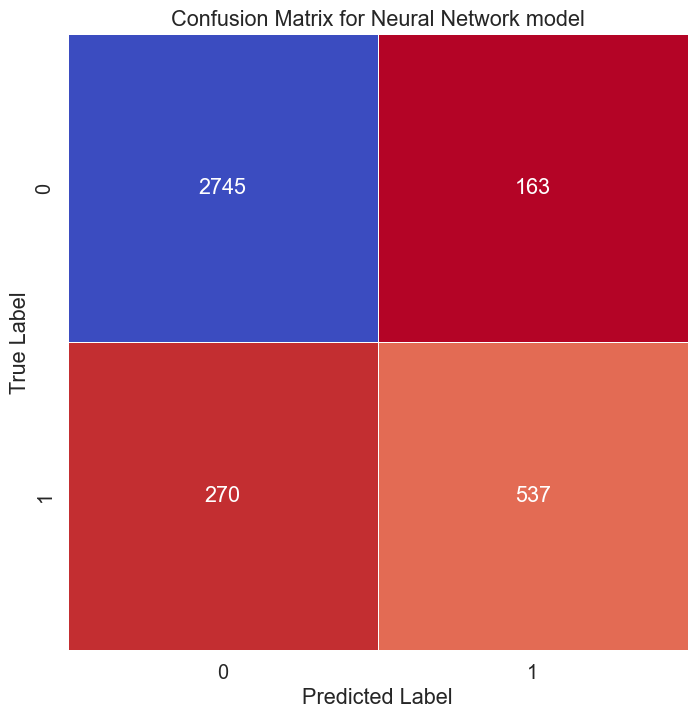

In [11]:
from sklearn.metrics import confusion_matrix, roc_auc_score
import seaborn as sns


y_pred_binary = [1 if val > 0.5 else 0 for val in model.predict(X_test)]
xr_matrix = confusion_matrix(y_test, y_pred_binary)
sns.set(font_scale=1.3)
plt.subplots(figsize=(8, 8))
sns.heatmap(xr_matrix,annot=True, cbar=False, cmap='coolwarm_r',linewidth=0.5,fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for Neural Network model');

We can see from the above tables that the model is good at predicting a true 0. However, we do see some inefficienies as the model has a tendency to predict a 0 when it is a true 1. This is reflected in the low recall score for class 1. This could lead to some problems in the context of the project because the model is predicting that the lender will not default, even though they do. As mentioned previously, this is most likely due to the unbalanced dataset and may need further action to improve.

Now, taking a look at our second ML method for this project, decision trees.

In [12]:
from sklearn import tree
from sklearn.datasets import load_iris

In [13]:
treeData = tree.DecisionTreeClassifier()
treeData = treeData.fit(X_train, y_train)

Similar to what we did for the neural network, we can take a look at the decision tree performace in the following code:

In [14]:
y_pred = treeData.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.89      0.90      2908
           1       0.62      0.67      0.65       807

    accuracy                           0.84      3715
   macro avg       0.76      0.78      0.77      3715
weighted avg       0.85      0.84      0.84      3715



Based on this, we can see that the decsision tree performed very similar to the neural network when it comes to model accuracy. When we use XGBoost, we actually see a model performance that is slightly better than the neural network. This demonstrates how XGBoost can help deal with the unbalanced dataset. By sequentially adding weak learners to the model and adjusting their weights based on the errors made in the previous iterations, XGBoost can effectively capture the patterns in the data, including the minority class. Let's also take a look at the confusion matrix to see if there are any changes:

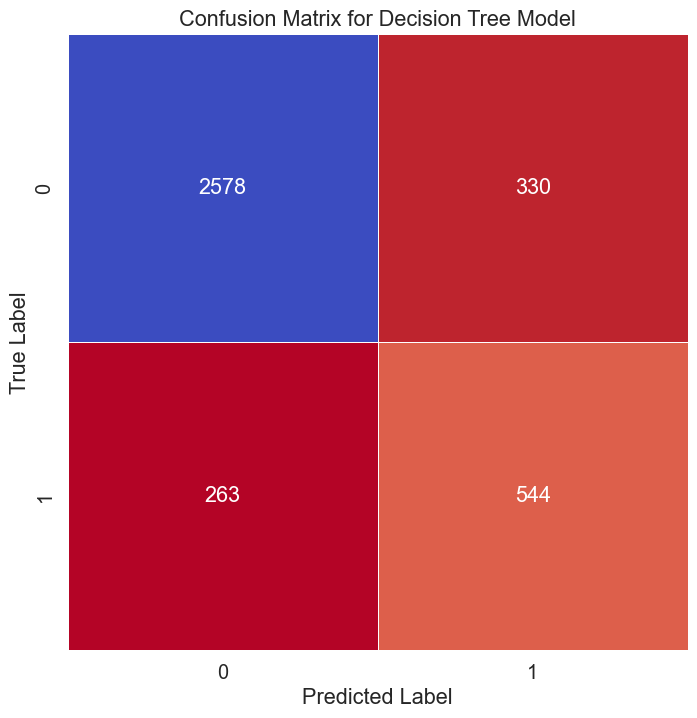

In [15]:
from sklearn.metrics import confusion_matrix, roc_auc_score
import seaborn as sns


y_pred=treeData.predict(X_test)
tr_matrix = confusion_matrix(y_test,y_pred)
sns.set(font_scale=1.3)
plt.subplots(figsize=(8, 8))
sns.heatmap(tr_matrix,annot=True, cbar=False, cmap='coolwarm_r',linewidth=0.5,fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for Decision Tree Model');

As shown, the decission tree performance was overall very comparable to the neural network when it came to the confusion matrix. Let's take a look at another form of a decsion tree and see if we can improve our classification:

In [16]:
from sklearn.ensemble import RandomForestClassifier
forestData = RandomForestClassifier(max_depth=20, random_state=5)
forestData.fit(X_train, y_train)
forest_pred = forestData.predict(X_test)
print(classification_report(y_test, forest_pred))

              precision    recall  f1-score   support

           0       0.91      0.96      0.93      2908
           1       0.82      0.64      0.72       807

    accuracy                           0.89      3715
   macro avg       0.86      0.80      0.83      3715
weighted avg       0.89      0.89      0.89      3715



The max_depth of 20 was determined by trial and error. It seemed to be show the best results. Anything more than 20, and the classifier ran into overfitting problems, and anything under, the model ran into underfitting problems. 

Overall, like the other methods, we seem to still have a low recall for class 1 due to the unbalanced dataset.

Like we have done for the previous methods, we also should check the confusion matrix to see if anything changed.

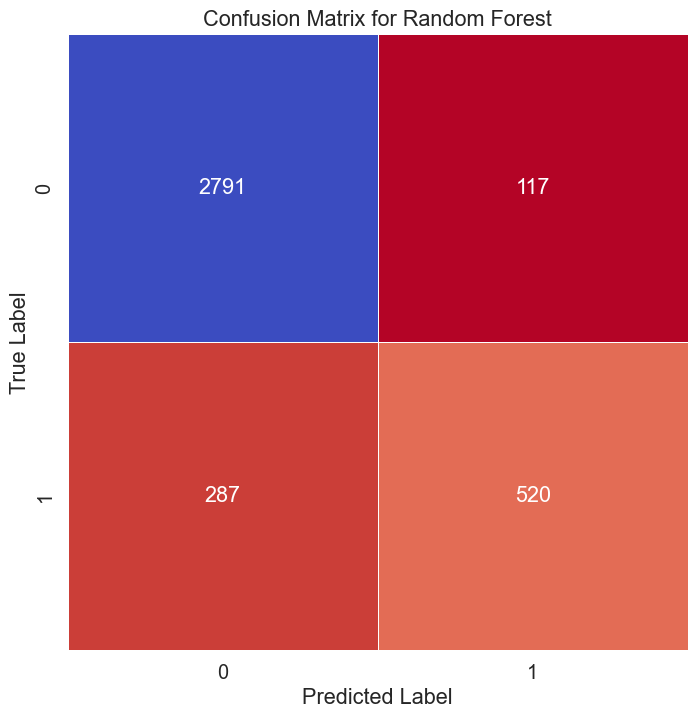

In [17]:
from sklearn.metrics import confusion_matrix, roc_auc_score
import seaborn as sns


forest_pred = forestData.predict(X_test)
tr_matrix = confusion_matrix(y_test,forest_pred)
sns.set(font_scale=1.3)
plt.subplots(figsize=(8, 8))
sns.heatmap(tr_matrix,annot=True, cbar=False, cmap='coolwarm_r',linewidth=0.5,fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for Random Forest');


We actually saw a slight decrease in the misclassification of class 1. The is signified by the lower value in the bottom left box when compared to the other two methods so far.

Now, let's look at the AUC score of the decision tree. AUC represents the probability that a random positive example is positioned to the right of a random negative example. AUC ranges in value from 0 to 1. A model whose predictions are 100% wrong has an AUC of 0.0; one whose predictions are 100% correct has an AUC of 1.0.

In [18]:
# Predict propabilities for the test data
tr_probs = treeData.predict_proba(X_test)

# Keep probabilities of the positive class only
tr_probs = tr_probs[:, 1]

# Compute the AUC Score for decision tree
auc_tr = roc_auc_score(y_test, tr_probs)
print('AUC: %.2f' % auc_tr)



# Now for the random forest
# Predict propabilities for the test data
tr_probs = forestData.predict_proba(X_test)

# Keep probabilities of the positive class only
tr_probs = tr_probs[:, 1]

# Compute the AUC Score
auc_tr = roc_auc_score(y_test, tr_probs)
print('AUC: %.2f' % auc_tr)

AUC: 0.78
AUC: 0.91


This means our decision tree is average and our random forest is above average. It is widely accepted that a model with an AUC score of less than 0.7 is bad, and anything more is either adequate or better.

Conclusion

Overall, I had a lot of fun working on this project. While the unbalanced dataset did lead to relatively poor model performance, I am happy with some of the outcomes I achieved. I really enjoyed taking this course and learning about all of the different data science techniques. I hope to continue my machine learning journey in the future.